# Importing Necessary Libraries

In [28]:
import os
import collections
import pandas as pd
import numpy as np
import functools
import matplotlib.pyplot as plt
import cv2

import xml.etree.ElementTree as ET

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# Setting up the File Paths

In [29]:
BASE_PATH = "/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Train/"
XML_PATH = os.path.join(BASE_PATH, "Annotations")
IMG_PATH = os.path.join(BASE_PATH, "Images")
XML_FILES = [os.path.join(XML_PATH, f) for f in os.listdir(XML_PATH)]

# XML Parser

In [30]:
class XmlParser(object):

    def __init__(self,xml_file):

        self.xml_file = xml_file
        self._root = ET.parse(self.xml_file).getroot()
        self._objects = self._root.findall("object")
        # path to the image file as describe in the xml file
        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)
        # image id 
        self.image_id = self._root.find("filename").text
        # names of the classes contained in the xml file
        self.names = self._get_names()
        # coordinates of the bounding boxes
        self.boxes = self._get_bndbox()

    def parse_xml(self):
        """"Parse the xml file returning the root."""
    
        tree = ET.parse(self.xml_file)
        return tree.getroot()

    def _get_names(self):

        names = []
        for obj in self._objects:
            name = obj.find("name")
            names.append(name.text)

        return np.array(names)

    def _get_bndbox(self):

        boxes = []
        for obj in self._objects:
            coordinates = []
            bndbox = obj.find("bndbox")
            coordinates.append(np.int32(bndbox.find("xmin").text))
            coordinates.append(np.int32(np.float32(bndbox.find("ymin").text)))
            coordinates.append(np.int32(bndbox.find("xmax").text))
            coordinates.append(np.int32(bndbox.find("ymax").text))
            boxes.append(coordinates)

        return np.array(boxes)

# Loading our Dataset Onto a Dataframe

In [31]:
def xml_files_to_df(xml_files):
    
    """"Return pandas dataframe from list of XML files."""
    
    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = XmlParser(file)
        names.extend(xml.names)
        if(len(xml.names)==0):
            names.extend(["BG"])   #note that if no boxes are found on an image we add a background box to enable data storing in a df
            boxes.extend([[0,0,600,600]])  
            image_id.extend([xml.image_id])
            xml_path.extend([xml.xml_file])
            img_path.extend([xml.img_path])
            
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}
    
    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()
    
    return df

df = xml_files_to_df(XML_FILES)


In [32]:
df

,image_id,names,boxes,xml_path,img_path
0,India_007360.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
1,Japan_007915.jpg,D20,"[363, 249, 587, 541]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
2,Japan_007915.jpg,D20,"[32, 180, 235, 449]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
3,Japan_007915.jpg,D10,"[225, 370, 465, 415]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
4,India_006920.jpg,D40,"[459, 516, 487, 539]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
...,...,...,...,...,...
41169,Japan_012273.jpg,D43,"[175, 482, 599, 544]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41170,Japan_004793.jpg,D50,"[207, 362, 278, 379]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41171,Japan_005371.jpg,D20,"[67, 426, 230, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41172,Japan_005371.jpg,D20,"[229, 423, 427, 490]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...


# Dataframe Cleaning and Fine Tuning

In [33]:
allowed_names = ['D00', 'D10', 'D20', 'D40','D44','D50','BG']

filtered_df = df[df['names'].isin(allowed_names)]

filtered_df

,image_id,names,boxes,xml_path,img_path
0,India_007360.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
1,Japan_007915.jpg,D20,"[363, 249, 587, 541]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
2,Japan_007915.jpg,D20,"[32, 180, 235, 449]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
3,Japan_007915.jpg,D10,"[225, 370, 465, 415]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
4,India_006920.jpg,D40,"[459, 516, 487, 539]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
...,...,...,...,...,...
41168,India_001539.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41170,Japan_004793.jpg,D50,"[207, 362, 278, 379]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41171,Japan_005371.jpg,D20,"[67, 426, 230, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41172,Japan_005371.jpg,D20,"[229, 423, 427, 490]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...


In [34]:
filtered_df = filtered_df.loc[filtered_df['image_id']!="Japan_001265.jpg"]

In [35]:
classes= {1:'D00',2:'D10',3:'D20',4:'D40',5:'D44',6:'D50',7:'BG'}

In [36]:
def map_label(name):
    for label, class_name in classes.items():
        if name == class_name:
            return label
    return None

# Add a new column 'label' based on the mapping
filtered_df['label'] = filtered_df['names'].apply(map_label)

/tmp/ipykernel_33/1234610195.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['label'] = filtered_df['names'].apply(map_label)


In [37]:
filtered_df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(filtered_df['boxes'].tolist(), index=filtered_df.index)

# Drop the original 'boxes' column
filtered_df.drop(columns=['boxes'], inplace=True)

/tmp/ipykernel_33/3252615247.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(filtered_df['boxes'].tolist(), index=filtered_df.index)
/tmp/ipykernel_33/3252615247.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(filtered_df['boxes'].tolist(), index=filtered_df.index)
/tmp/ipykernel_33/3252615247.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [38]:
filtered_df.drop(columns=['names'], inplace=True)

/tmp/ipykernel_33/1131615130.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.drop(columns=['names'], inplace=True)


# Splitting the Dataset into Training and Validation Sets

In [39]:
image_ids = df['image_id'].unique()
print(len(image_ids))

21041


# Custom Dataset Loader and it's Visualisation

In [40]:
device = 'cpu'

In [41]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)
num_classes = 8

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


# Loading the Saved Checkpoints and Running on Test Data

In [42]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

WEIGHTS_FILE = "/kaggle/input/road-images-dataset-for-road-fault-detection/faster_rcnn_state.pth"

num_classes = 8 

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the traines weights
model.load_state_dict(torch.load(WEIGHTS_FILE,map_location='cpu'))

model = model.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=None`.
  warnings.warn(msg)


In [43]:
def obj_detector(img):
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)


    img /= 255.0
    img = torch.from_numpy(img)
    img = img.unsqueeze(0)
    img = img.permute(0,3,1,2)
    
    model.eval()

    detection_threshold = 0.65
    
    img = list(im.to(device) for im in img)
    output = model(img)

    for i , im in enumerate(img):
        boxes = output[i]['boxes'].data.cpu().numpy()
        scores = output[i]['scores'].data.cpu().numpy()
        labels = output[i]['labels'].data.cpu().numpy()

        labels = labels[scores >= detection_threshold]
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold]

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    
    sample = img[0].permute(1,2,0).cpu().numpy()
    sample = np.array(sample)
    boxes = output[0]['boxes'].data.cpu().numpy()
    name = output[0]['labels'].data.cpu().numpy()
    scores = output[0]['scores'].data.cpu().numpy()
    
    boxes = boxes[scores >= detection_threshold].astype(np.int32)
    names = name.tolist()
    
    return names, boxes, sample

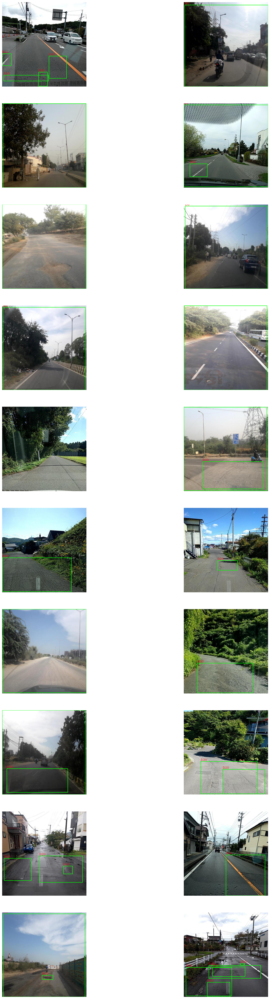

In [44]:
pred_path = "/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Test/Images/" 
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))
for i, images in enumerate(pred_files):
    if i > 19:break
    plt.subplot(10,2,i+1)
    names,boxes,sample = obj_detector(images)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)
#     plt.savefig('save_image.png', bbox_inches='tight')  # if you want to save result

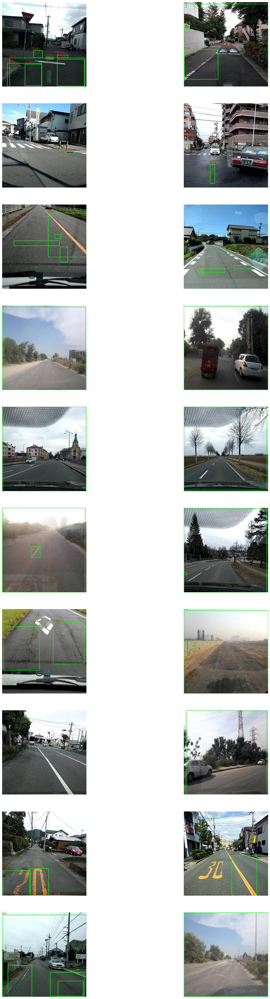

In [45]:
pred_path = "/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Test/Images/"
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))
for i, images in enumerate(pred_files):
    if i<39:continue
    if i>58:break    
    plt.subplot(10,2,i+1-39)
    names,boxes,sample = obj_detector(images)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)
#     plt.savefig('save_image.png', bbox_inches='tight')  # if you want to save result